In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/moo_and_mcmc/dream')

In [3]:
traces = {}
for trace in ['a']:
    traces[trace] = [np.load('earm_mtdreamzs_3chain_uniform_filledhistory.15_10000iter_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_mtdreamzs_3chain_uniform_filledhistory.15_10000iter_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a']:
    logps[trace] = [np.load('earm_mtdreamzs_3chain_uniform_filledhistory.15_10000iter_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_mtdreamzs_3chain_uniform_filledhistory.15_10000iter_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[ 104.18199224]
 [ 106.85640631]
 [ 106.94162225]
 ..., 
 [ 107.58519284]
 [ 107.03127203]
 [ 107.03127203]]
Logp of trace:  a  chain:  1  =  [ 106.75332431]
Logp of trace:  a  chain:  2  =  [ 105.88142424]


In [5]:
traces['a'][0][:,72]

array([ 6.18492165,  6.18417883,  6.16904574, ...,  6.74836473,
        6.75536712,  6.75536712])

In [6]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [7]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  64  of  105  parameters.
Percent of parameters with GR below 1.2:  60.9523809524
Number of parameters with GR below 1.1:  32  of  105  parameters.
Percent of parameters with GR below 1.1:  30.4761904762


[64, 60.952380952380956, 32, 30.476190476190478]

10000
3
10000


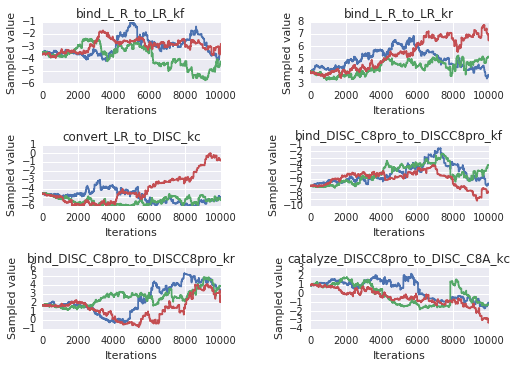

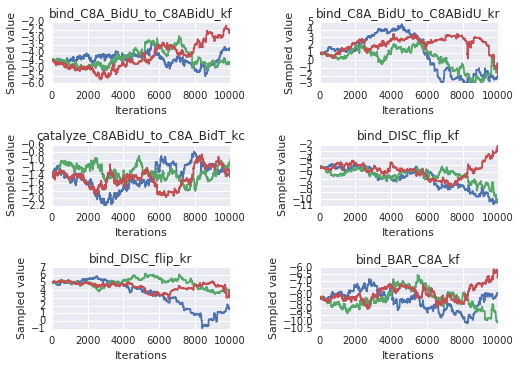

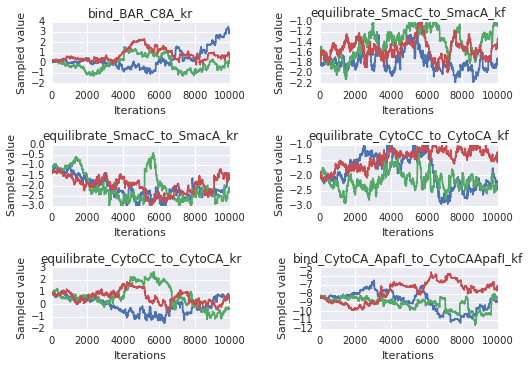

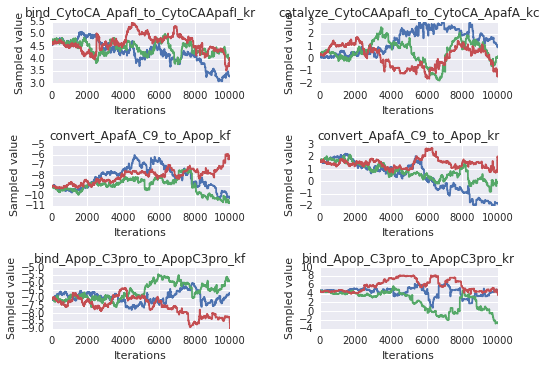

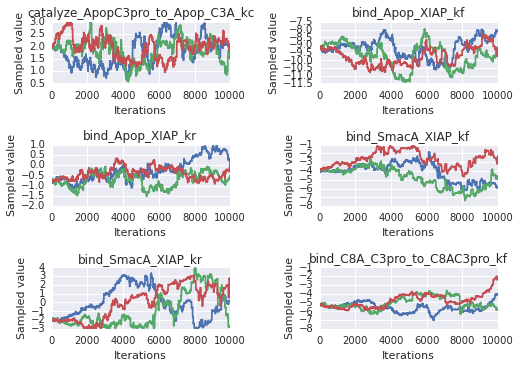

...

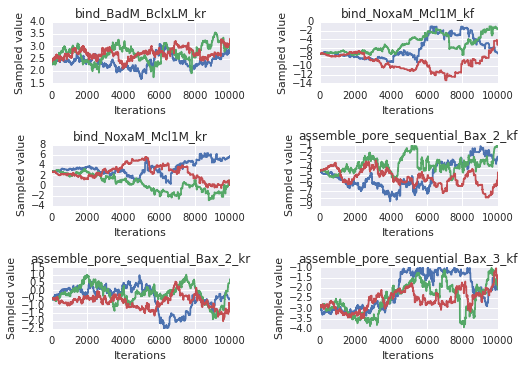

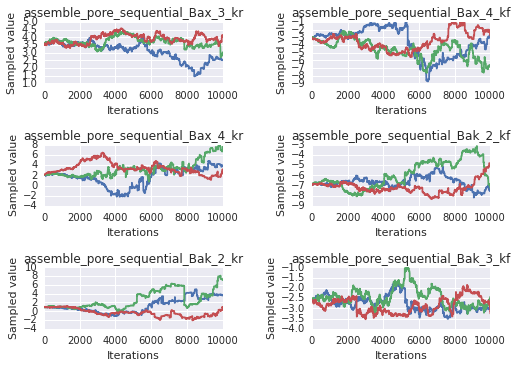

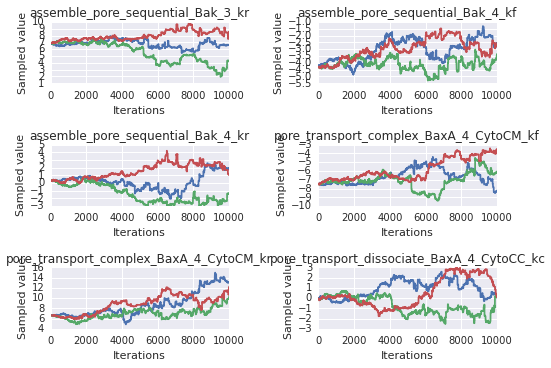

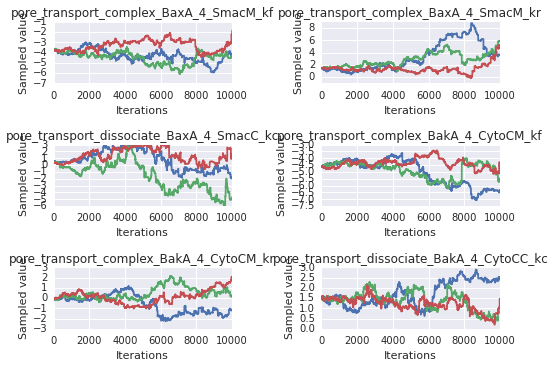

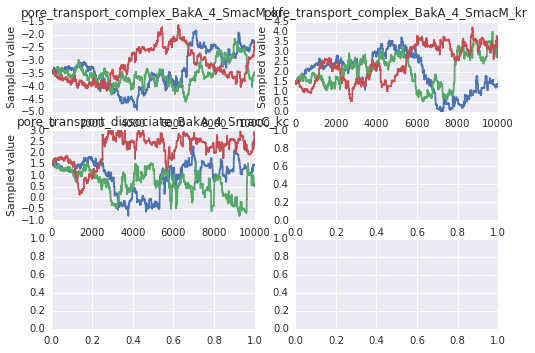

In [8]:
sample_plots(param_trace_dicts['a'])

In [9]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=5000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


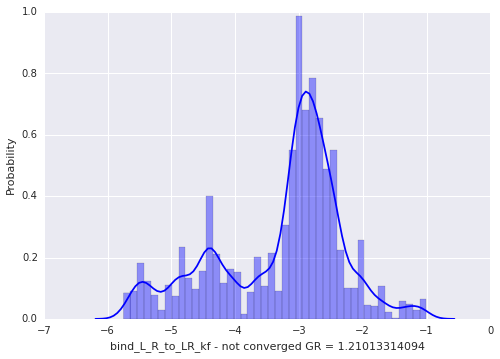

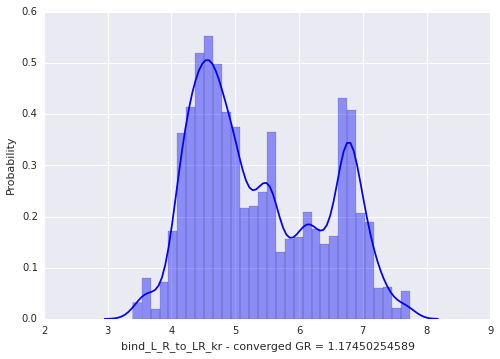

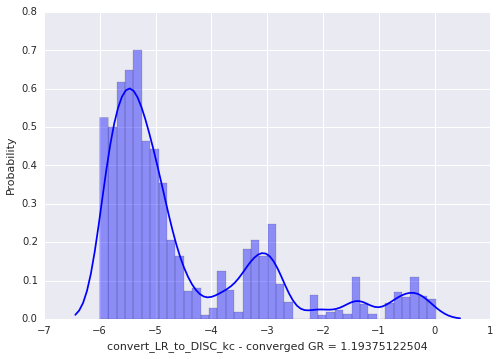

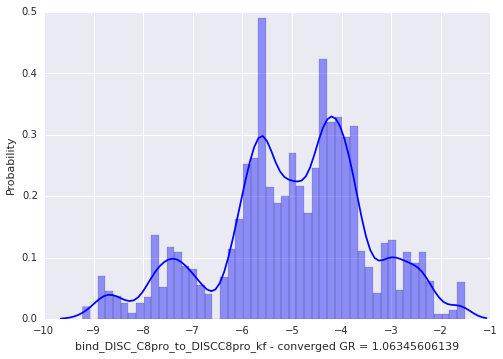

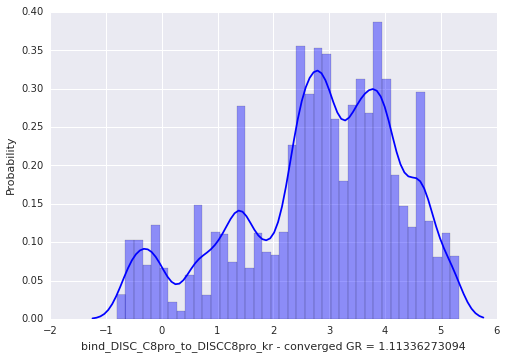

...

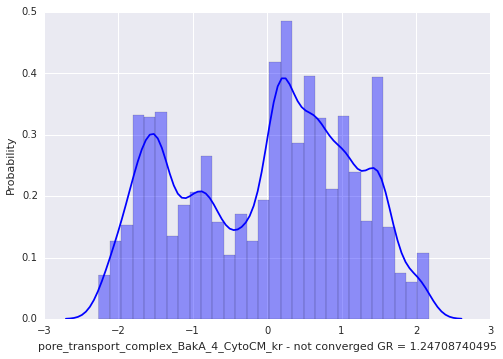

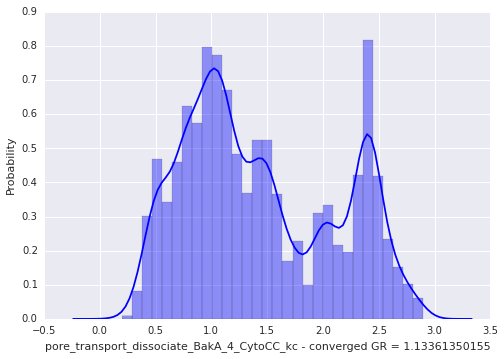

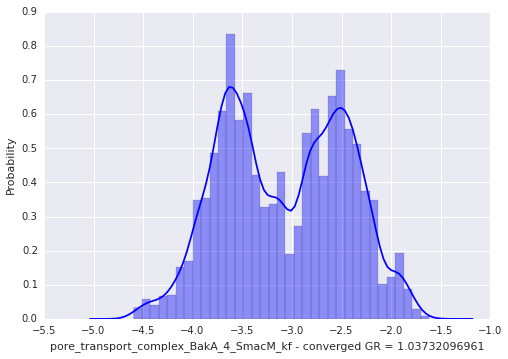

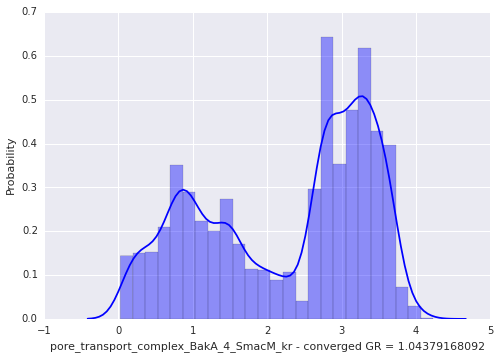

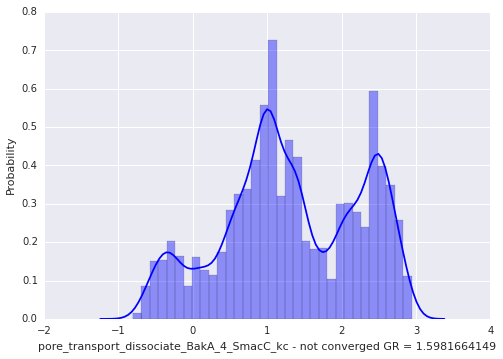

In [10]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [11]:
traces['a'][1][:,0]

array([-3.61670915, -3.61670915, -3.61670915, ..., -4.26077961,
       -4.26077961, -4.26077961])

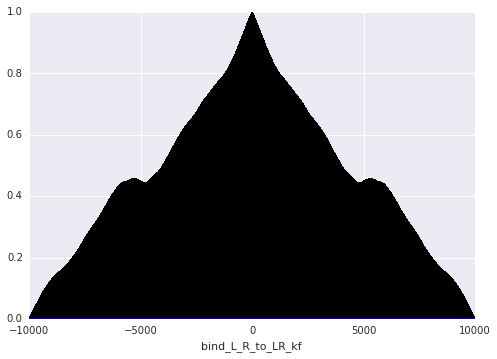

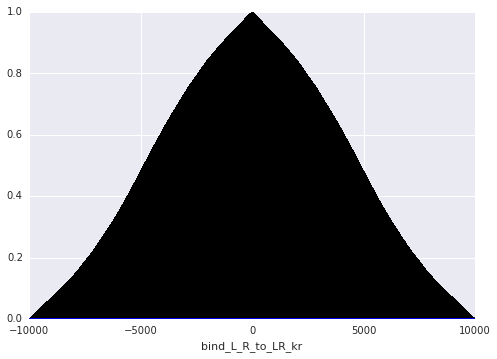

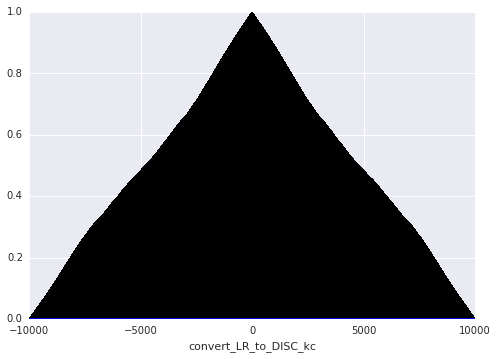

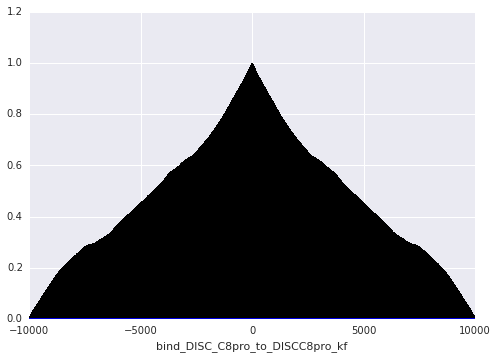

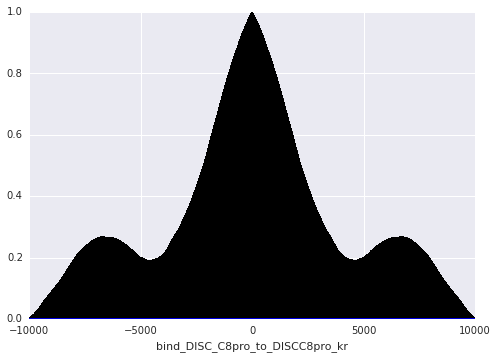

...

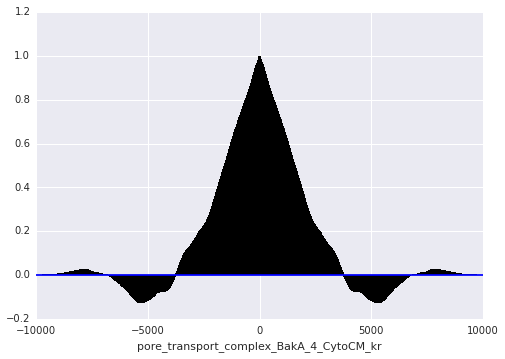

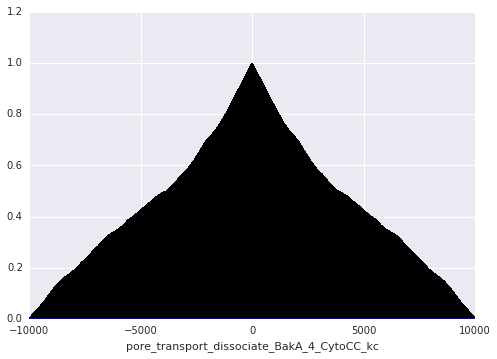

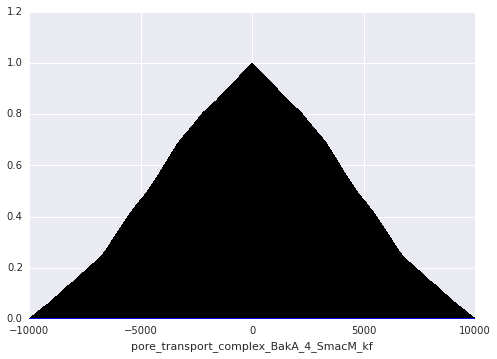

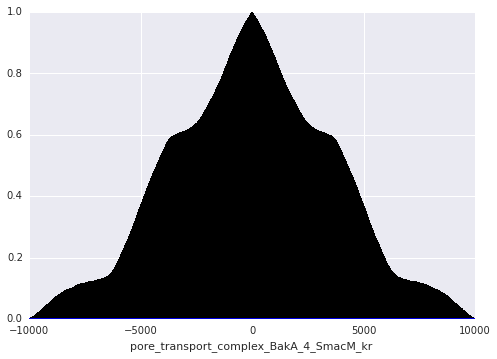

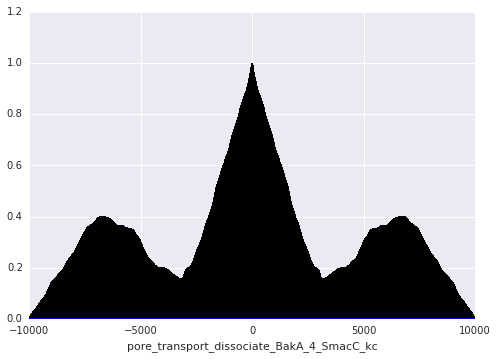

In [12]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

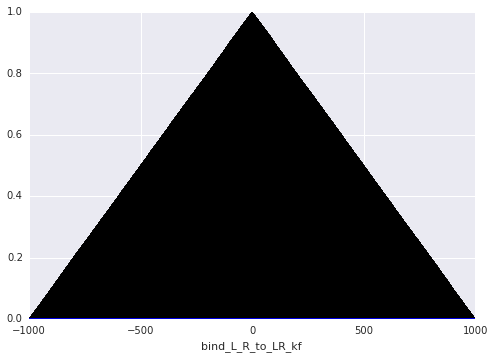

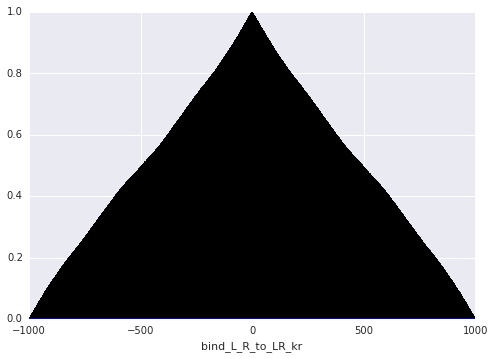

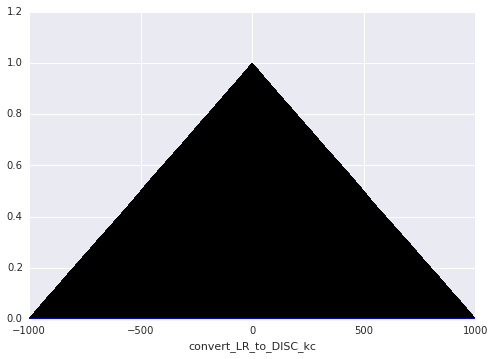

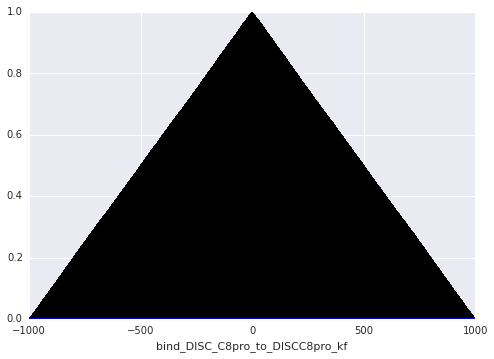

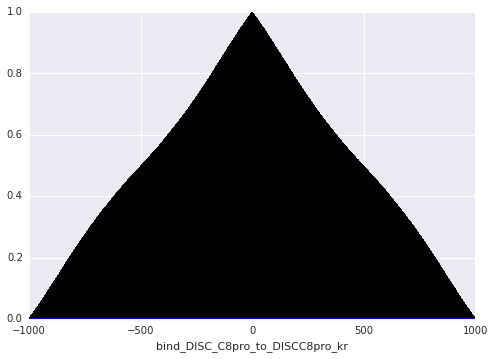

...

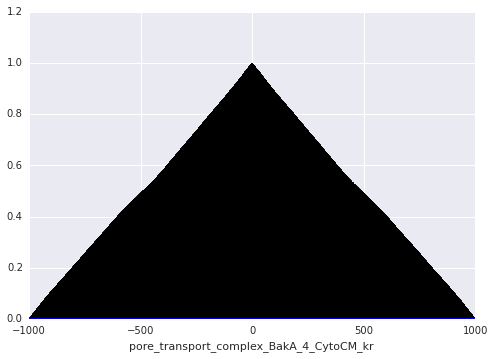

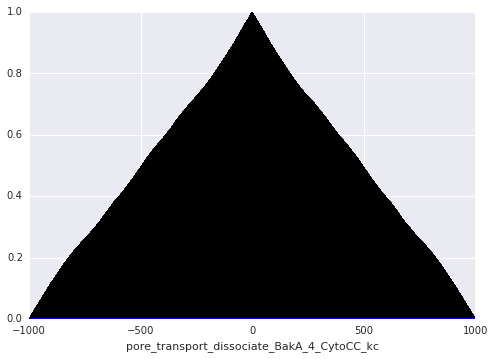

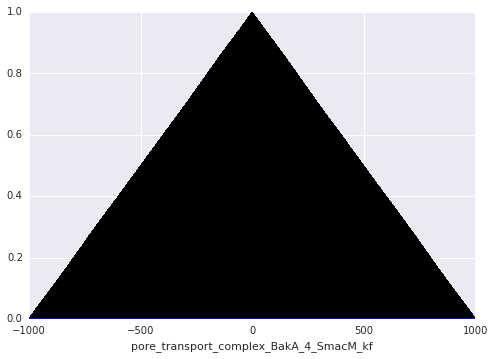

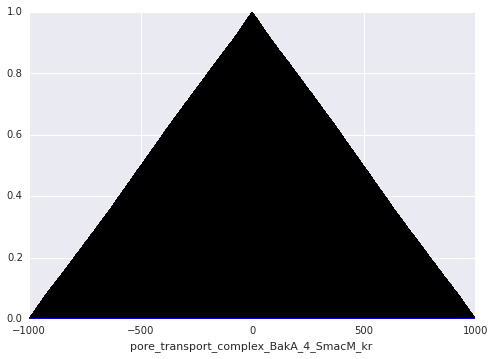

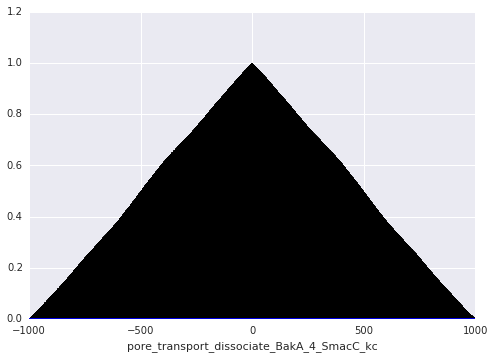

In [14]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

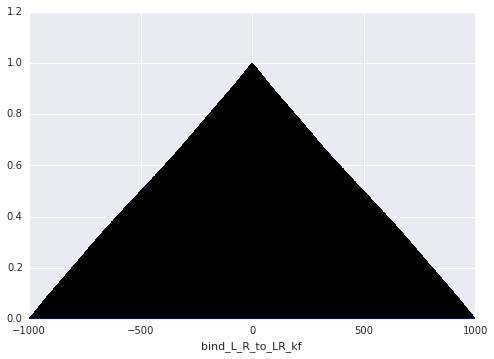

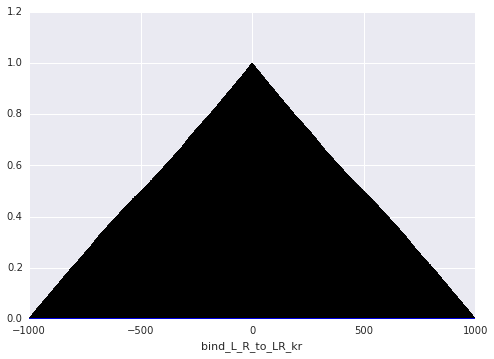

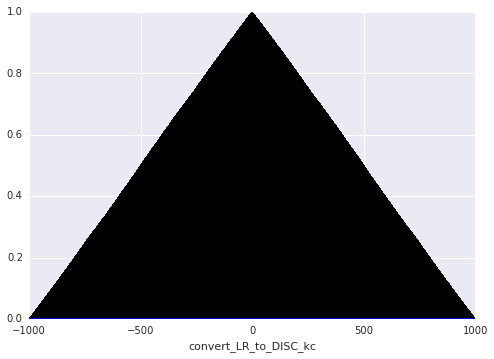

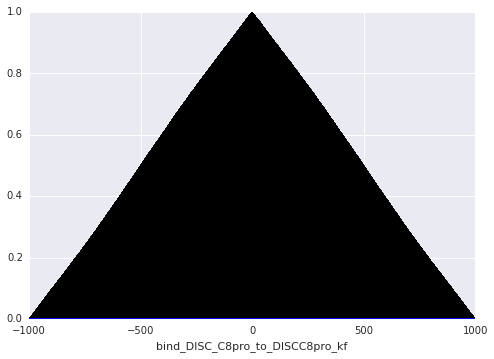

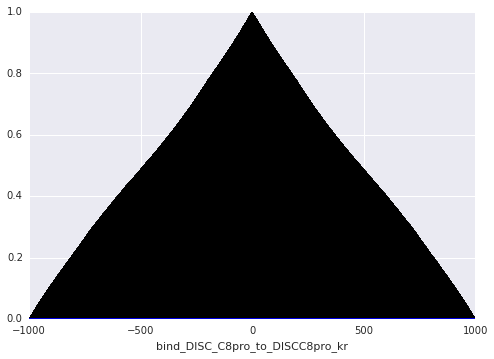

...

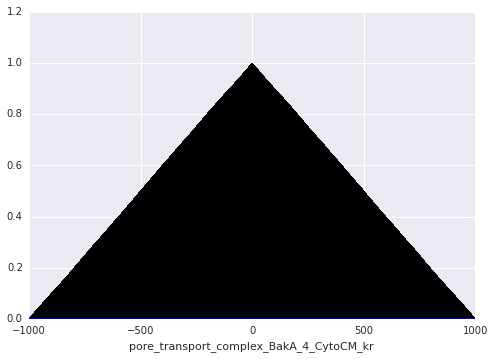

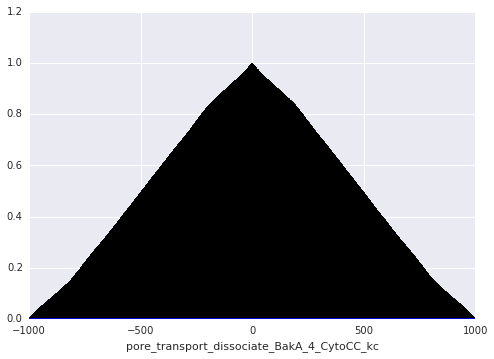

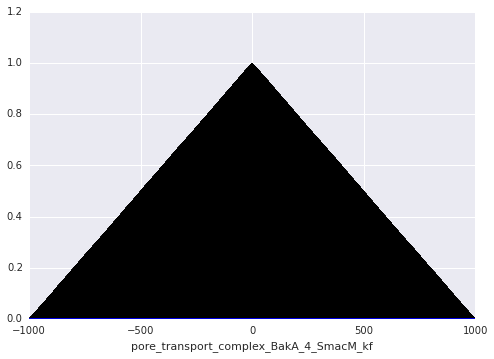

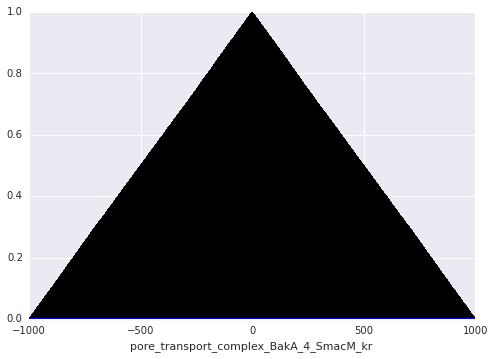

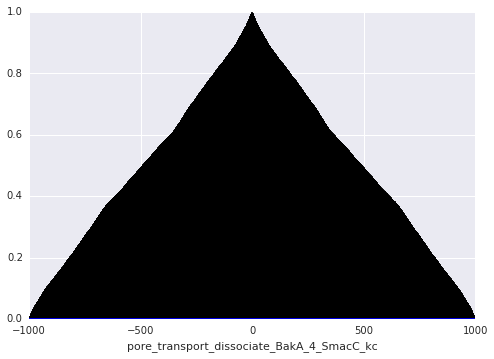

In [15]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [13]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1955  acceptance rate:  0.1955
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1920  acceptance rate:  0.192
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1846  acceptance rate:  0.1846
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1917  acceptance rate:  0.1917
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1936  acceptance rate:  0.1936
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1970  acceptance rate:  0.197
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  2016  acceptance rate:  0.2016
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1959  acceptance rate:  0.1959
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1840  acceptance rate:  0.184
N acceptances for parameter:  bind_DISC_flip_kf  =  1987  acceptance rate:  0.1987
N acceptances for parameter:  bind_DISC_flip_kr  =  2010  acceptance rate:  0.201
N accepta

array([ 0.1955,  0.192 ,  0.1846,  0.1917,  0.1936,  0.197 ,  0.2016,
        0.1959,  0.184 ,  0.1987,  0.201 ,  0.1976,  0.1981,  0.1987,
        0.1947,  0.1993,  0.2031,  0.1989,  0.1997,  0.1978,  0.2013,
        0.2027,  0.1992,  0.1954,  0.1982,  0.2029,  0.2046,  0.2007,
        0.1991,  0.197 ,  0.2018,  0.191 ,  0.1978,  0.195 ,  0.2035,
        0.2018,  0.1992,  0.197 ,  0.1969,  0.1983,  0.1961,  0.1994,
        0.2012,  0.1986,  0.1977,  0.2018,  0.2028,  0.1977,  0.201 ,
        0.203 ,  0.2011,  0.2069,  0.1958,  0.1984,  0.1968,  0.2037,
        0.1975,  0.1946,  0.1921,  0.2002,  0.1987,  0.1978,  0.2008,
        0.1978,  0.1954,  0.1973,  0.1962,  0.2001,  0.1971,  0.2013,
        0.1992,  0.2026,  0.1978,  0.2019,  0.1932,  0.2016,  0.2001,
        0.2001,  0.2039,  0.198 ,  0.2012,  0.1995,  0.2029,  0.1953,
        0.2044,  0.1987,  0.1998,  0.2032,  0.1999,  0.1966,  0.2004,
        0.2016,  0.2017,  0.1974,  0.2014,  0.1951,  0.2022,  0.2044,
        0.2009,  0.2

In [14]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  2183  acceptance rate:  0.2183
N acceptances for parameter:  bind_L_R_to_LR_kr  =  2096  acceptance rate:  0.2096
N acceptances for parameter:  convert_LR_to_DISC_kc  =  2013  acceptance rate:  0.2013
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  2129  acceptance rate:  0.2129
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  2222  acceptance rate:  0.2222
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  2174  acceptance rate:  0.2174
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  2133  acceptance rate:  0.2133
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  2191  acceptance rate:  0.2191
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  2039  acceptance rate:  0.2039
N acceptances for parameter:  bind_DISC_flip_kf  =  2205  acceptance rate:  0.2205
N acceptances for parameter:  bind_DISC_flip_kr  =  2207  acceptance rate:  0.2207
N acc

array([ 0.2183,  0.2096,  0.2013,  0.2129,  0.2222,  0.2174,  0.2133,
        0.2191,  0.2039,  0.2205,  0.2207,  0.2211,  0.2203,  0.2204,
        0.2234,  0.2213,  0.2181,  0.2205,  0.2232,  0.2198,  0.2202,
        0.2229,  0.221 ,  0.2245,  0.2257,  0.2192,  0.2233,  0.214 ,
        0.2227,  0.2139,  0.2176,  0.2167,  0.2244,  0.21  ,  0.2186,
        0.2242,  0.2194,  0.2197,  0.2194,  0.2207,  0.2199,  0.2209,
        0.2271,  0.2158,  0.2194,  0.224 ,  0.2213,  0.2257,  0.2212,
        0.2194,  0.2184,  0.2246,  0.2194,  0.2158,  0.2149,  0.223 ,
        0.2169,  0.221 ,  0.2198,  0.2233,  0.219 ,  0.2146,  0.2208,
        0.216 ,  0.2222,  0.2217,  0.2189,  0.2215,  0.2174,  0.2228,
        0.2243,  0.223 ,  0.2198,  0.222 ,  0.2202,  0.2226,  0.2194,
        0.2218,  0.2186,  0.2203,  0.2208,  0.2215,  0.222 ,  0.2235,
        0.2227,  0.2174,  0.2138,  0.2157,  0.2202,  0.2256,  0.2211,
        0.2229,  0.2179,  0.2224,  0.2175,  0.2215,  0.2185,  0.2205,
        0.2249,  0.2

In [15]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  2007  acceptance rate:  0.2007
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1944  acceptance rate:  0.1944
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1855  acceptance rate:  0.1855
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1962  acceptance rate:  0.1962
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  2037  acceptance rate:  0.2037
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1990  acceptance rate:  0.199
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  2020  acceptance rate:  0.202
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1994  acceptance rate:  0.1994
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1854  acceptance rate:  0.1854
N acceptances for parameter:  bind_DISC_flip_kf  =  2016  acceptance rate:  0.2016
N acceptances for parameter:  bind_DISC_flip_kr  =  2035  acceptance rate:  0.2035
N accep

array([ 0.2007,  0.1944,  0.1855,  0.1962,  0.2037,  0.199 ,  0.202 ,
        0.1994,  0.1854,  0.2016,  0.2035,  0.1975,  0.194 ,  0.2015,
        0.1993,  0.198 ,  0.2051,  0.2042,  0.1994,  0.2087,  0.2032,
        0.2044,  0.196 ,  0.2002,  0.2034,  0.1992,  0.1993,  0.2   ,
        0.2021,  0.1958,  0.1979,  0.2028,  0.2019,  0.2013,  0.2021,
        0.1953,  0.1971,  0.1978,  0.1977,  0.1994,  0.2   ,  0.1969,
        0.199 ,  0.1996,  0.1957,  0.2009,  0.1997,  0.2022,  0.2038,
        0.1992,  0.1999,  0.2008,  0.1985,  0.2019,  0.2009,  0.2047,
        0.2046,  0.1969,  0.1967,  0.1969,  0.2015,  0.194 ,  0.2   ,
        0.204 ,  0.2025,  0.1986,  0.1986,  0.1968,  0.1999,  0.2008,
        0.2011,  0.2032,  0.1994,  0.197 ,  0.1949,  0.2026,  0.1999,
        0.2001,  0.2043,  0.2007,  0.2034,  0.2012,  0.1991,  0.2065,
        0.1998,  0.1985,  0.202 ,  0.1992,  0.2028,  0.2006,  0.2011,
        0.199 ,  0.2006,  0.1987,  0.205 ,  0.2025,  0.1955,  0.1983,
        0.1989,  0.2

In [39]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
running_acceptance_rates = np.zeros((len(traces['a'][2][0]), len(traces['a'][2])))
running_acceptance_rates_100window = np.zeros((len(traces['a'][2][0]), 100))
for dim in range(len(traces['a'][2][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
running_acceptance_rates
running_acceptance_rates_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  2007  acceptance rate:  0.2007
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1944  acceptance rate:  0.1944
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1855  acceptance rate:  0.1855
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1962  acceptance rate:  0.1962
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  2037  acceptance rate:  0.2037
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1990  acceptance rate:  0.199
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  2020  acceptance rate:  0.202
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1994  acceptance rate:  0.1994
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1854  acceptance rate:  0.1854
N acceptances for parameter:  bind_DISC_flip_kf  =  2016  acceptance rate:  0.2016
N acceptances for parameter:  bind_DISC_flip_kr  =  2035  acceptance rate:  0.2035
N accep

array([[ 0.  ,  0.33,  0.37, ...,  0.14,  0.09,  0.12],
       [ 0.  ,  0.34,  0.39, ...,  0.11,  0.07,  0.11],
       [ 0.  ,  0.31,  0.42, ...,  0.11,  0.1 ,  0.1 ],
       ..., 
       [ 0.  ,  0.36,  0.42, ...,  0.11,  0.09,  0.06],
       [ 0.  ,  0.34,  0.38, ...,  0.09,  0.09,  0.14],
       [ 0.  ,  0.39,  0.46, ...,  0.1 ,  0.07,  0.12]])

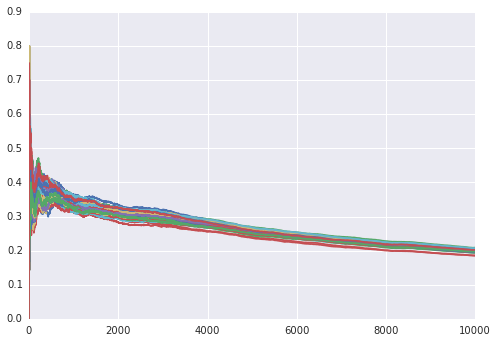

In [40]:
for dim in range(105):
    plt.plot(range(10000), running_acceptance_rates[dim,:])

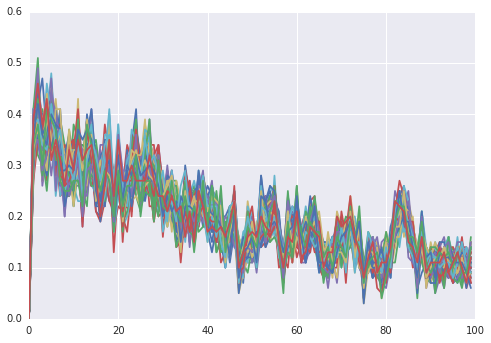

In [41]:
for dim in range(105):
    plt.plot(range(100), running_acceptance_rates_100window[dim, :])

In [33]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
running_acceptance_rates = np.zeros((len(traces['a'][1][0]), len(traces['a'][1])))
running_acceptance_rates_100window = np.zeros((len(traces['a'][1][0]), 100))
for dim in range(len(traces['a'][1][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
running_acceptance_rates
running_acceptance_rates_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  2183  acceptance rate:  0.2183
N acceptances for parameter:  bind_L_R_to_LR_kr  =  2096  acceptance rate:  0.2096
N acceptances for parameter:  convert_LR_to_DISC_kc  =  2013  acceptance rate:  0.2013
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  2129  acceptance rate:  0.2129
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  2222  acceptance rate:  0.2222
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  2174  acceptance rate:  0.2174
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  2133  acceptance rate:  0.2133
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  2191  acceptance rate:  0.2191
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  2039  acceptance rate:  0.2039
N acceptances for parameter:  bind_DISC_flip_kf  =  2205  acceptance rate:  0.2205
N acceptances for parameter:  bind_DISC_flip_kr  =  2207  acceptance rate:  0.2207
N acc

array([[ 0.  ,  0.36,  0.4 , ...,  0.15,  0.15,  0.09],
       [ 0.  ,  0.35,  0.33, ...,  0.15,  0.14,  0.05],
       [ 0.  ,  0.36,  0.35, ...,  0.12,  0.13,  0.08],
       ..., 
       [ 0.  ,  0.33,  0.37, ...,  0.14,  0.13,  0.12],
       [ 0.  ,  0.34,  0.39, ...,  0.2 ,  0.16,  0.12],
       [ 0.  ,  0.33,  0.34, ...,  0.2 ,  0.12,  0.09]])

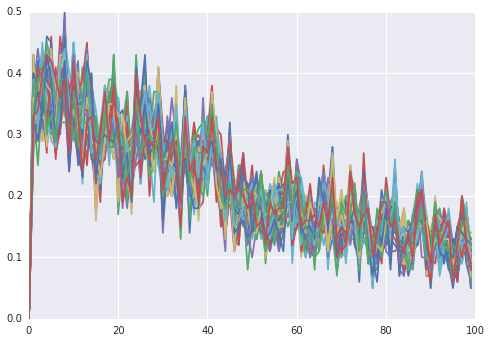

In [34]:
for dim in range(105):
    plt.plot(range(100), running_acceptance_rates_100window[dim, :])

In [37]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
running_acceptance_rates = np.zeros((len(traces['a'][0][0]), len(traces['a'][0])))
running_acceptance_rates_100window = np.zeros((len(traces['a'][0][0]), 100))
for dim in range(len(traces['a'][0][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
running_acceptance_rates
running_acceptance_rates_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1955  acceptance rate:  0.1955
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1920  acceptance rate:  0.192
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1846  acceptance rate:  0.1846
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1917  acceptance rate:  0.1917
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1936  acceptance rate:  0.1936
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1970  acceptance rate:  0.197
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  2016  acceptance rate:  0.2016
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1959  acceptance rate:  0.1959
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1840  acceptance rate:  0.184
N acceptances for parameter:  bind_DISC_flip_kf  =  1987  acceptance rate:  0.1987
N acceptances for parameter:  bind_DISC_flip_kr  =  2010  acceptance rate:  0.201
N accepta

array([[ 0.  ,  0.37,  0.36, ...,  0.15,  0.08,  0.12],
       [ 0.  ,  0.29,  0.37, ...,  0.13,  0.07,  0.11],
       [ 0.  ,  0.3 ,  0.39, ...,  0.1 ,  0.08,  0.11],
       ..., 
       [ 0.  ,  0.36,  0.39, ...,  0.16,  0.05,  0.11],
       [ 0.  ,  0.39,  0.39, ...,  0.13,  0.09,  0.09],
       [ 0.  ,  0.38,  0.32, ...,  0.15,  0.07,  0.11]])

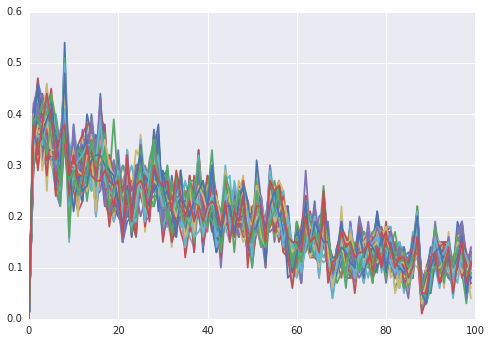

In [38]:
for dim in range(105):
    plt.plot(range(100), running_acceptance_rates_100window[dim, :])